# Activity 14: Image Processing Methods Using Convolution
<hr>

**Name:** Cabral, Jose Paulo C.

## Convolution and Image Processing Functions and the Kernels

Imported necessary libraries.

In [1]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import sys
import cv2
import numpy as np
import os

Function to process image.

In [2]:
def processImage(image, mode='grayscale'):
    if mode == 'rgb':
        image = cv2.imread(image)
        image = cv2.cvtColor(src=image, code=cv2.COLOR_BGR2RGB)
        return image
    elif mode == 'grayscale':
        image = cv2.imread(image)
        image = cv2.cvtColor(src=image, code=cv2.COLOR_BGR2GRAY)
        return image
    else:
        image = cv2.imread(image)
        return image

Create a dedicated `exports` directory.

In [3]:
EXPORTS_PATH = './exports'
if not os.path.exists(EXPORTS_PATH):
    os.makedirs(EXPORTS_PATH)

Function for convolution.

In [4]:
def convolve2D(image, kernel, padding=0, strides=1):
    # Cross Correlation
    kernel = np.flipud(np.fliplr(kernel))

    # Gather Shapes of Kernel + Image + Padding
    xKernShape = kernel.shape[0]
    yKernShape = kernel.shape[1]
    xImgShape = image.shape[0]
    yImgShape = image.shape[1]

    # Shape of Output Convolution
    xOutput = int(((xImgShape - xKernShape + 2 * padding) / strides) + 1)
    yOutput = int(((yImgShape - yKernShape + 2 * padding) / strides) + 1)
    output = np.zeros((xOutput, yOutput))

    # Apply Equal Padding to All Sides
    if padding != 0:
        imagePadded = np.zeros((image.shape[0] + padding*2, image.shape[1] + padding*2))
        imagePadded[int(padding):int(-1 * padding), int(padding):int(-1 * padding)] = image
    else:
        imagePadded = image

    # Iterate through image
    for y in range(image.shape[1]):
        # Exit Convolution
        if y > image.shape[1] - yKernShape:
            break
        # Only Convolve if y has gone down by the specified Strides
        if y % strides == 0:
            for x in range(image.shape[0]):
                # Go to next row once kernel is out of bounds
                if x > image.shape[0] - xKernShape:
                    break
                try:
                    # Only Convolve if x has moved by the specified Strides
                    if x % strides == 0:
                        output[x, y] = (kernel * imagePadded[x: x + xKernShape, y: y + yKernShape]).sum()
                except:
                    break

    return output

Function for generating outputs and comparisons.

In [5]:
def generateOutput(image, kernel, filename, mode='rgb', padding=2):
    processed_image = processImage(image, mode)
    output = convolve2D(processed_image, kernel, padding=padding)
    cv2.imwrite(filename, output)
    
    image_in = Image.open(image)
    image_in_array = np.array(image)
    
    image_out = Image.open(filename)
    image_out_array = np.array(filename)
    
    fig, ax = plt.subplots(1,2, figsize=(20,10))
    ax[0].imshow(image_in)
    ax[1].imshow(image_out, cmap="gray")
    

The kernel functions.

In [6]:
# Roberts (Hr)
roberts_hr = np.array([[0, 0, -1],
                       [0, 1, 0],
                       [0, 0, 0]])

# Roberts (Hc)
roberts_hc = np.array([[-1, 0, 0],
                       [0, 1, 0],
                       [0, 0, 0]])

# Prewitt (Hr)
prewirr_hr = np.array([[1, 0, -1],
                       [1, 0, -1],
                       [1, 0, -1]])

# Prewitt (Hc)
prewirr_hc = np.array([[-1, -1, -1],
                       [0, 0, 0],
                       [1, 1, 1]])

# Sobel (Hr)
sobel_hr = np.array([[1, 0, -1],
                     [2, 0, -2],
                     [1, 0, -1]])

# Sobel (Hc)
sobel_hc = np.array([[-1, -2, -1],
                     [0, 0, 0],
                     [1, 2, 1]])

# Gaussian Smoothing
gaussian = (1/16) * np.array([[1, 2, 1],
                              [2, 4, 2],
                              [1, 2, 1]])                

# Image Sharpening
img_sharpening = np.array([[0, -1, 0],
                           [-1, 5, -1],
                           [0, -1, 0]])

# Prewitt Compass Operator (North)
prewitt_cmps_north = np.array([[1, 1, 1],
                              [1, -2, 1],
                              [-1, -1, -1]])

# Prewitt Compass Operator (South)
prewitt_cmps_south = np.array([[-1, -1, -1],
                              [1, -2, 1],
                              [1, 1, 1]])

# Prewitt Compass Operator (East)
prewitt_cmps_east = np.array([[-1, 1, 1],
                              [-1, -2, 1],
                              [-1, 1, 1]])

# Prewitt Compass Operator (West)
prewitt_cmps_west = np.array([[1, 1, -1],
                              [1, -2, -1],
                              [1, 1, -1]])

# Kirsch Compass Operator (North)
kirsch_cmps_north = np.array([[5, 5, 5],
                              [-3, 0, -3],
                              [-3, -3, -3]])

# Kirsch Compass Operator (South)
kirsch_cmps_south = np.array([[-3, -3, -3],
                              [-3, 0, -3],
                              [5, 5, 5]])

# Kirsch Compass Operator (East)
kirsch_cmps_east = np.array([[-3, -3, 5],
                             [-3, 0, 5],
                             [-3, -3, 5]])

# Kirsch Compass Operator (West)
kirsch_cmps_west = np.array([[5, -3, -3],
                             [5, 0, -3],
                             [5, -3, -3]])

# Robinson Compass Operator (North)
robinson_cmps_north = np.array([[1, 1, 1],
                                [0, 0, 0],
                                [-1, -1, -1]])

# Robinson Compass Operator (South)
robinson_cmps_south = np.array([[-1, -1, -1],
                                [0, 0, 0],
                                [1, 1, 1]])

# Robinson Compass Operator (East)
robinson_cmps_east = np.array([[-1, 0, 1],
                               [-1, 0, 1],
                               [-1, 0, 1]])

# Robinson Compass Operator (West)
robinson_cmps_west = np.array([[1, 0, -1],
                               [1, 0, -1],
                               [1, 0, -1]])

# Laplacian Operator (Positive)
laplacian_opr_pos = np.array([[0, -1, 0],
                              [-1, 4, -1],
                              [0, -1, 0]])

# Laplacian Operator (Negative)
laplacian_opr_neg = np.array([[0, 1, 0],
                              [1, -4, 1],
                              [0, 1, 0]])

## Applying the Convolution Kernels to Images

### Roberts, Prewitt, Sobel Method

In [7]:
image = "./dataset/coins.jpg"

#### Roberts

##### Hr

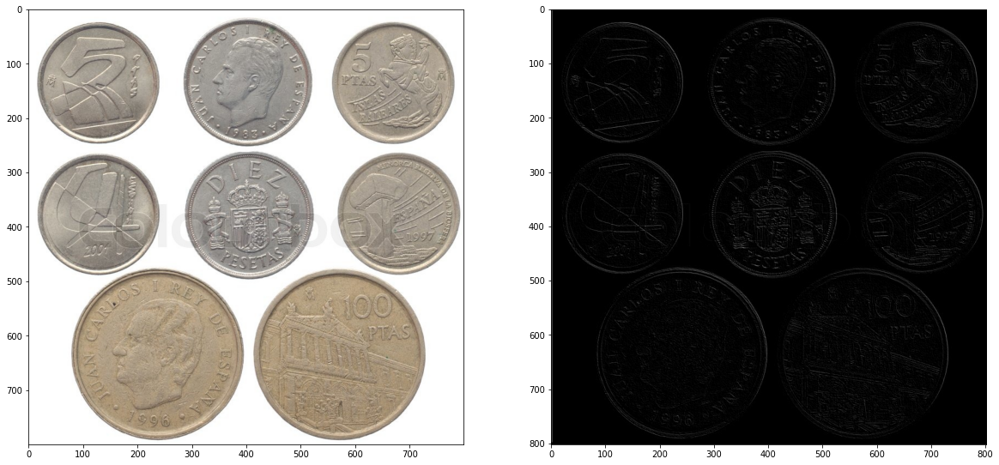

In [8]:
generateOutput(image=image, kernel=roberts_hr, filename='./exports/roberts-hr.png', mode='grayscale', padding=2)

##### Hc

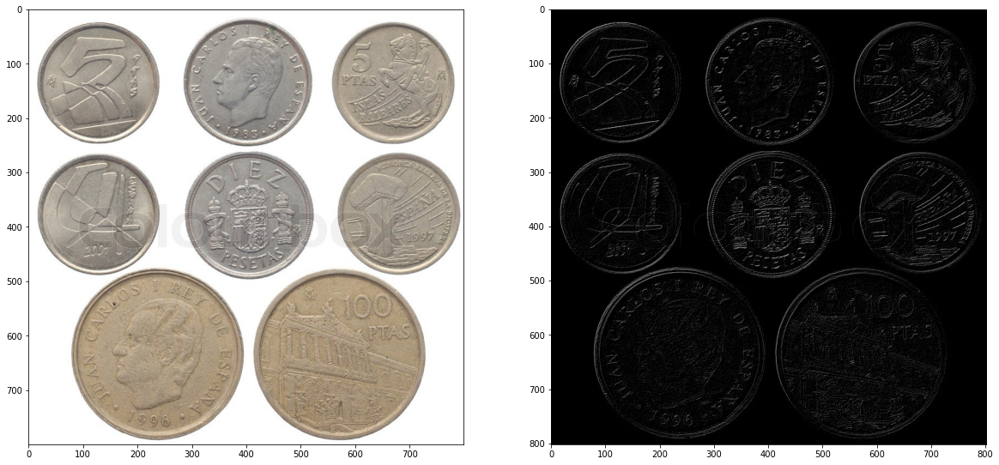

In [9]:
generateOutput(image=image, kernel=roberts_hc, filename='./exports/roberts-hc.png', mode='grayscale', padding=2)

#### Prewitt

##### Hr

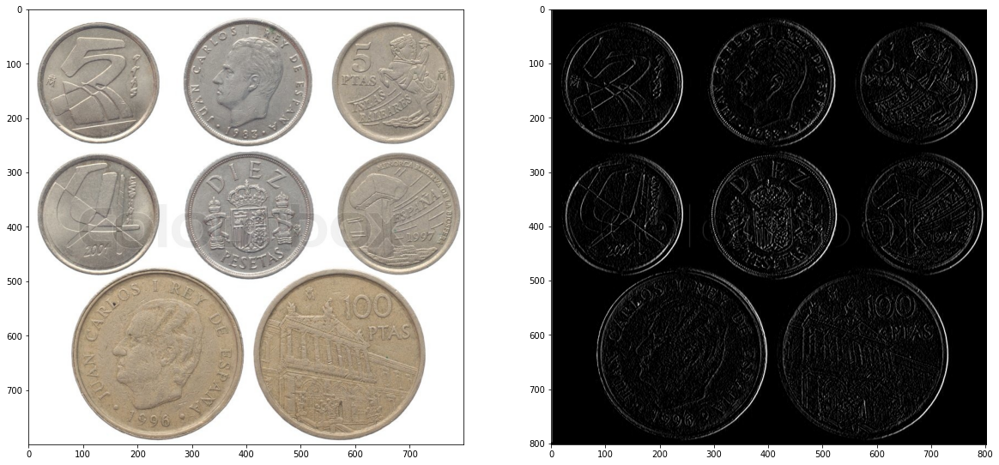

In [10]:
generateOutput(image=image, kernel=prewirr_hr, filename='./exports/prewitt-hr-coins.jpg', mode='grayscale', padding=2)

##### Hc

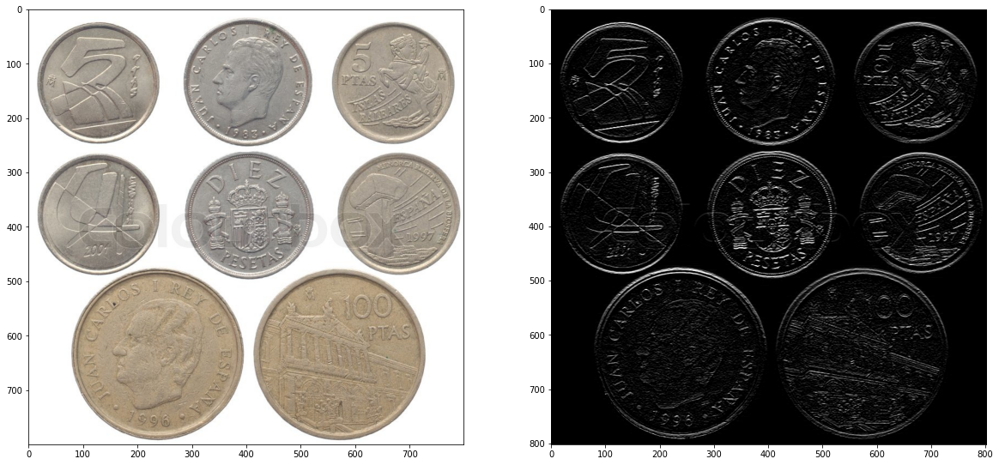

In [11]:
generateOutput(image=image, kernel=prewirr_hc, filename='./exports/prewitt-hc.png', mode='grayscale', padding=2)

#### Sobel

##### Hr

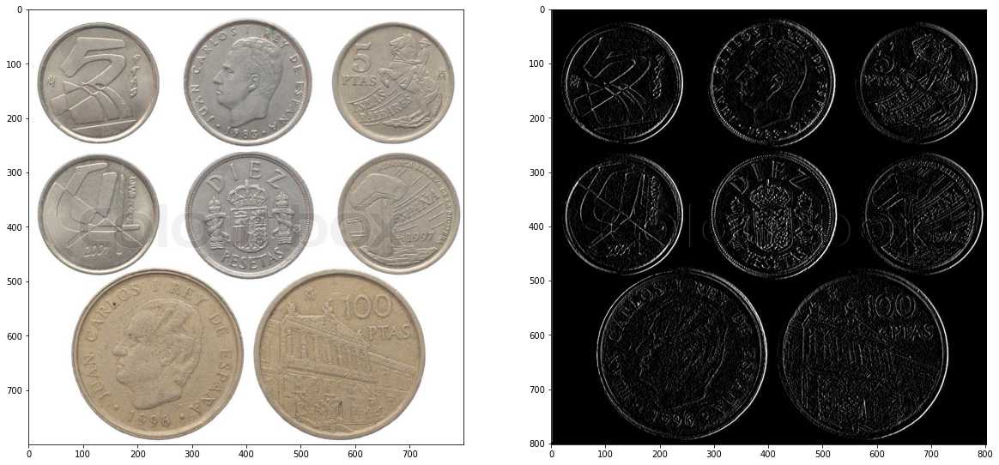

In [12]:
generateOutput(image=image, kernel=sobel_hr, filename='./exports/sobel-hr-coins.jpg', mode='grayscale', padding=2)

##### Hc

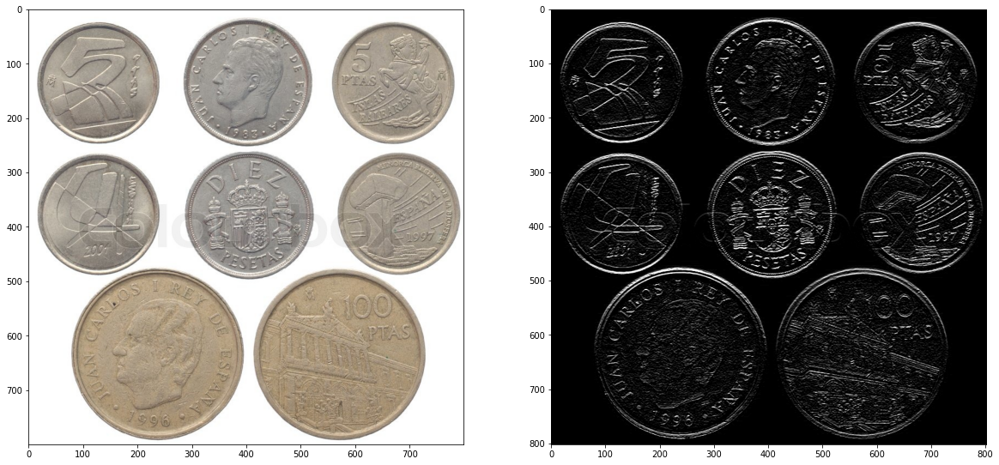

In [13]:
generateOutput(image=image, kernel=sobel_hc, filename='./exports/sobel-hc.png', mode='grayscale', padding=2)

### Gaussian Smoothing

In [14]:
image = "./dataset/lenna.png"

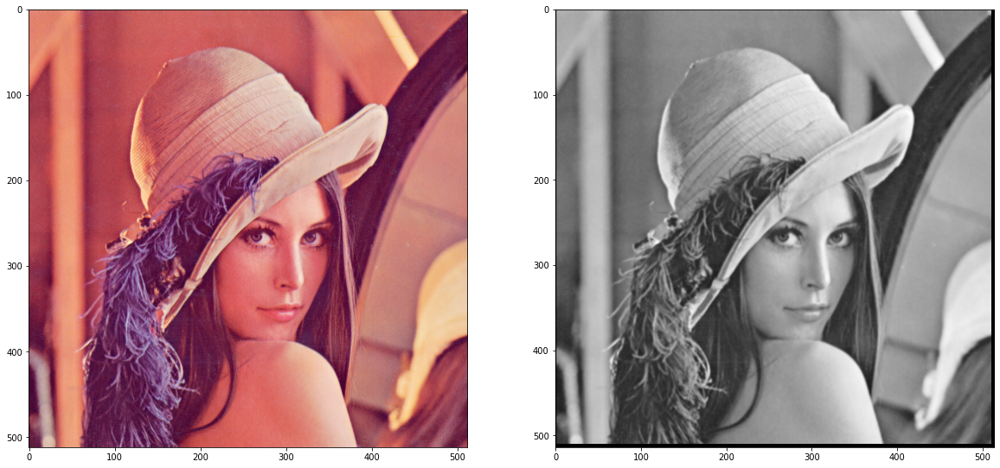

In [15]:
generateOutput(image=image, kernel=gaussian, filename='./exports/gaussian.png', mode='grayscale', padding=2)

### Image Sharpening

In [16]:
image = "./dataset/sick-leaf.jpg"

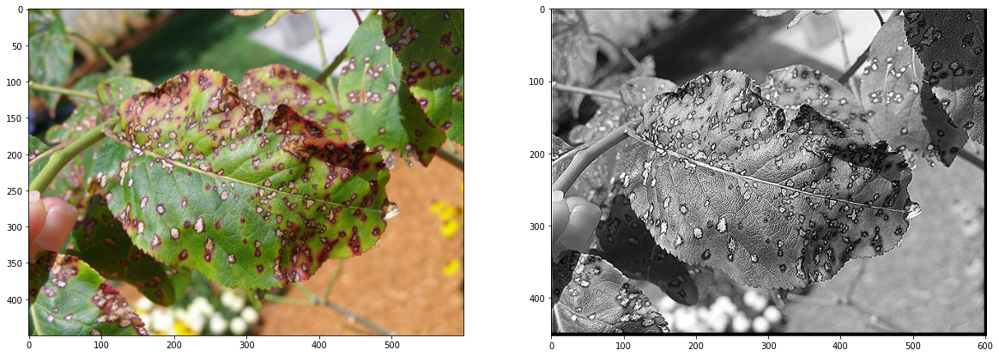

In [17]:
generateOutput(image=image, kernel=img_sharpening, filename='./exports/img-sharpening.png', mode='grayscale', padding=2)

### Compass Operators

In [18]:
image = "./dataset/sign-board.jfif"

#### Prewitt

##### North

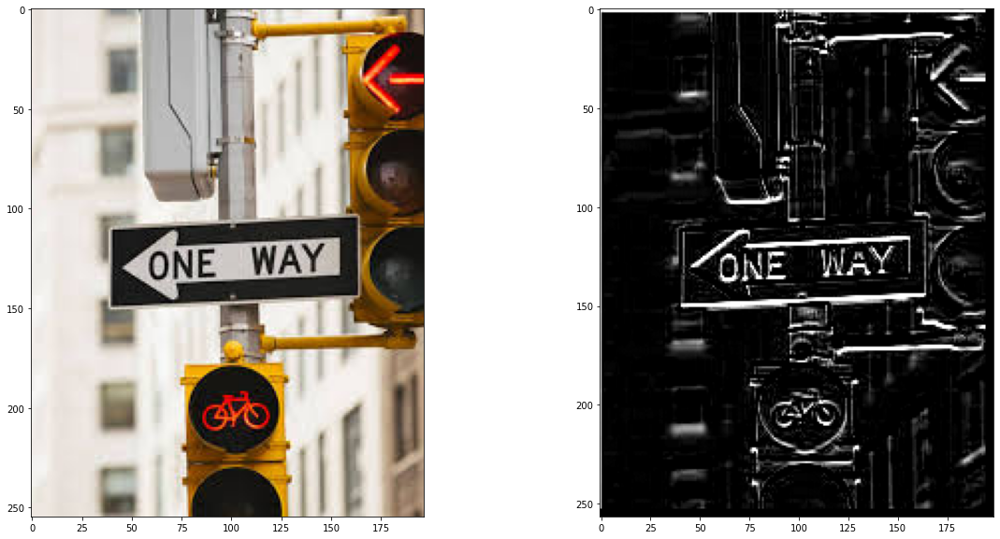

In [19]:
generateOutput(image=image, kernel=prewitt_cmps_north, filename='./exports/prewitt-cmp-opr-north.png', mode='grayscale', padding=2)

##### East

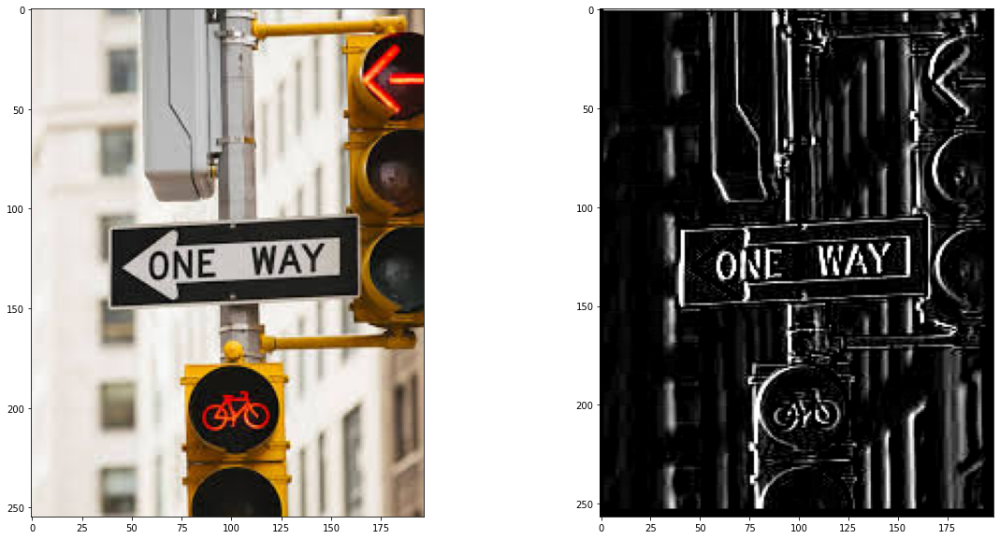

In [20]:
generateOutput(image=image, kernel=prewitt_cmps_east, filename='./exports/prewitt-cmp-opr-east.png', mode='grayscale', padding=2)

##### South

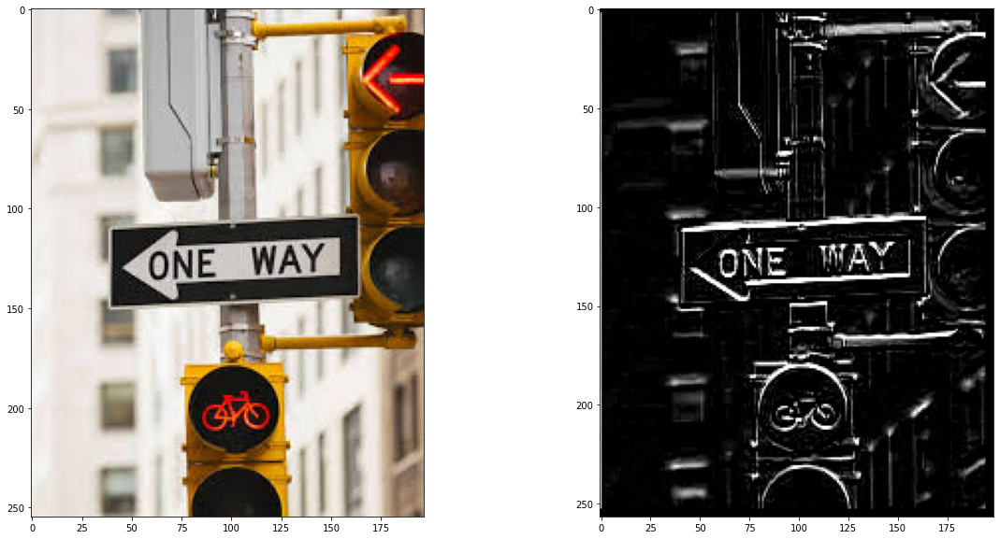

In [21]:
generateOutput(image=image, kernel=prewitt_cmps_south, filename='./exports/prewitt-cmp-opr-south.png', mode='grayscale', padding=2)

##### West

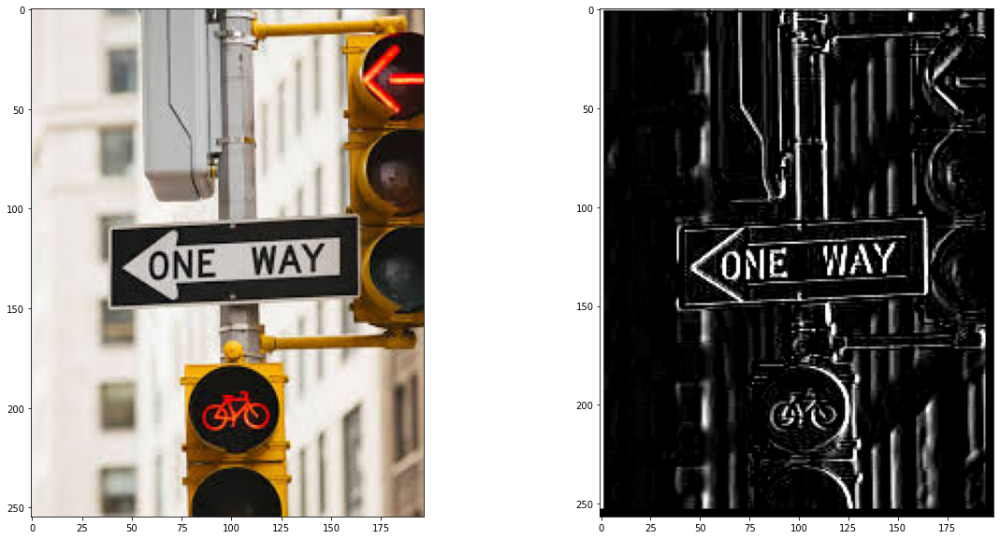

In [22]:
generateOutput(image=image, kernel=prewitt_cmps_west, filename='./exports/prewitt-cmp-opr-west.png', mode='grayscale', padding=2)

#### Kirsch

##### North

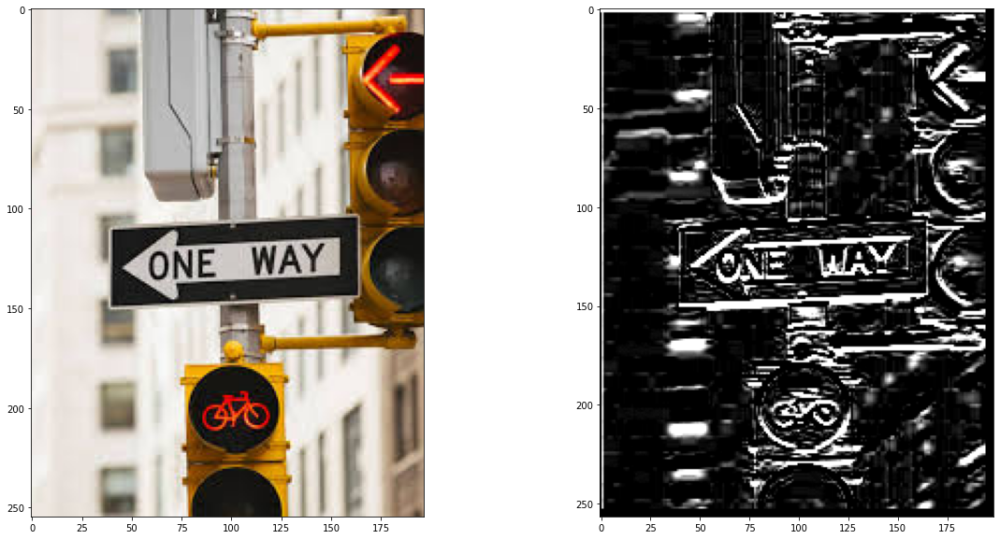

In [23]:
generateOutput(image=image, kernel=kirsch_cmps_north, filename='./exports/kirsch-cmp-opr-north.png', mode='grayscale', padding=2)

##### East

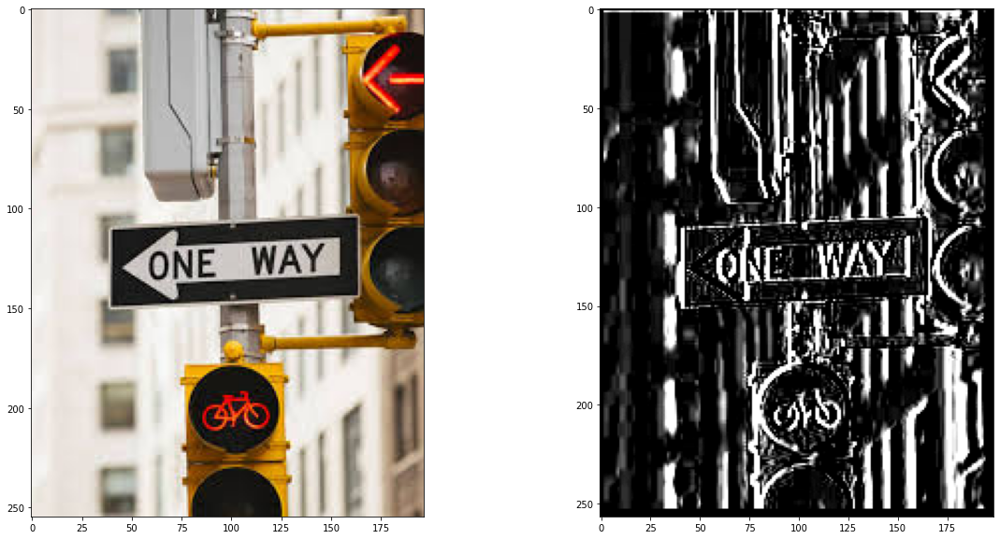

In [24]:
generateOutput(image=image, kernel=kirsch_cmps_east, filename='./exports/kirsch-cmp-opr-east.png', mode='grayscale', padding=2)

##### South

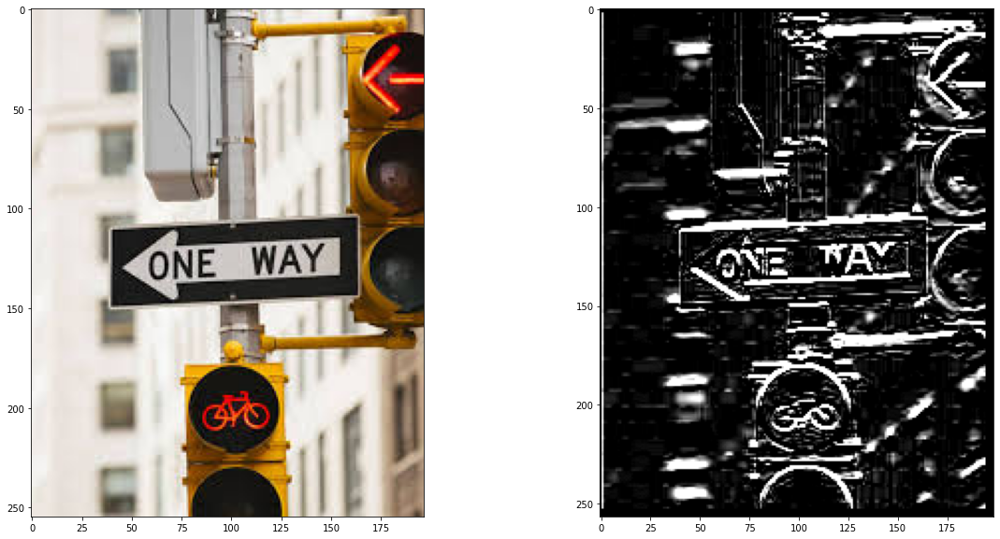

In [25]:
generateOutput(image=image, kernel=kirsch_cmps_south, filename='./exports/kirsch-cmp-opr-south.png', mode='grayscale', padding=2)

##### West

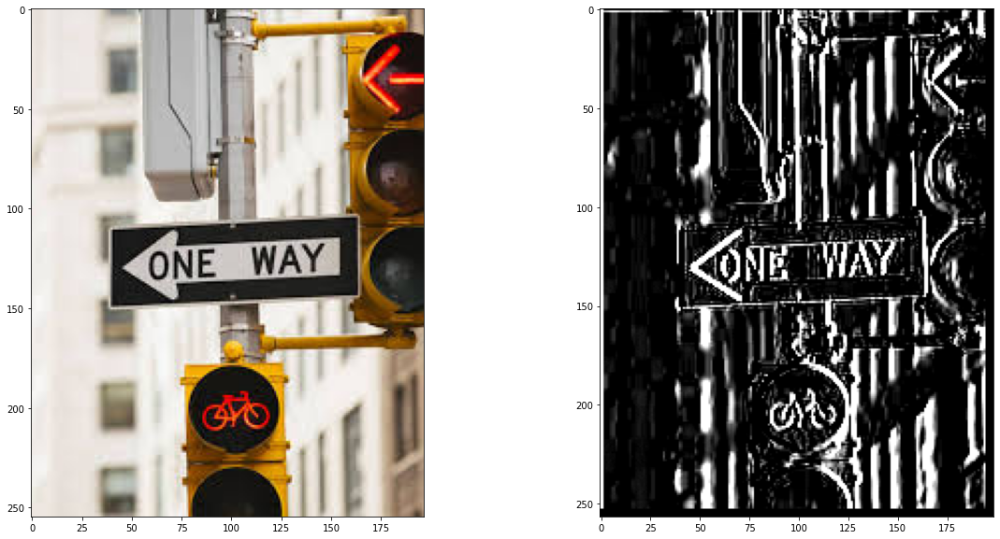

In [26]:
generateOutput(image=image, kernel=kirsch_cmps_west, filename='./exports/kirsch-cmp-opr-west.png', mode='grayscale', padding=2)

#### Robinson

##### North

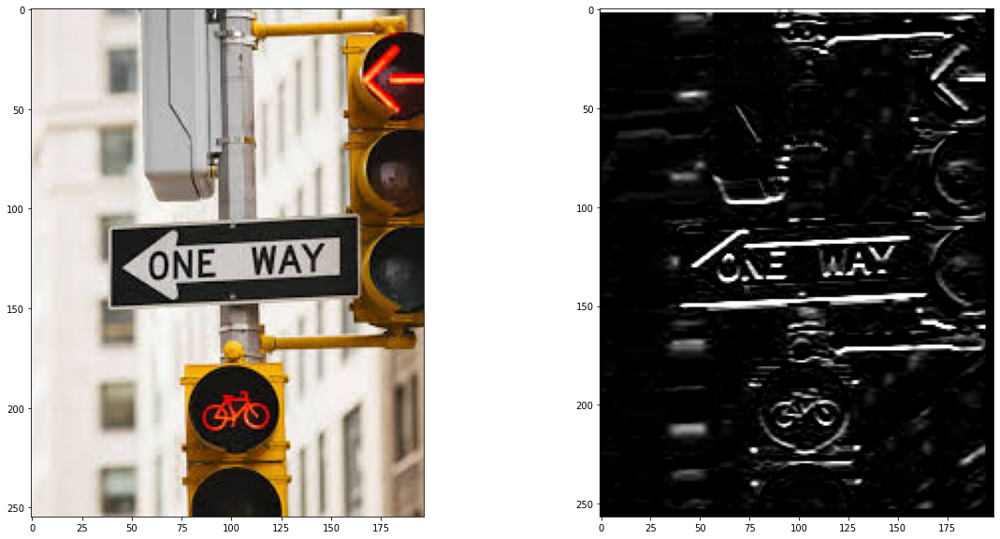

In [27]:
generateOutput(image=image, kernel=robinson_cmps_north, filename='./exports/robinson-cmp-opr-north.png', mode='grayscale', padding=2)

##### East

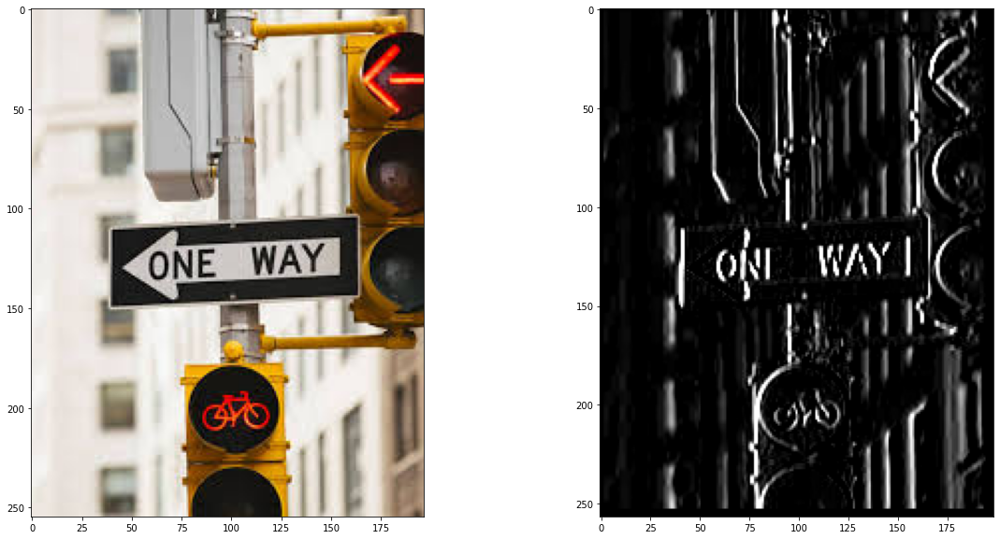

In [28]:
generateOutput(image=image, kernel=robinson_cmps_east, filename='./exports/robinson-cmp-opr-east.png', mode='grayscale', padding=2)

##### South

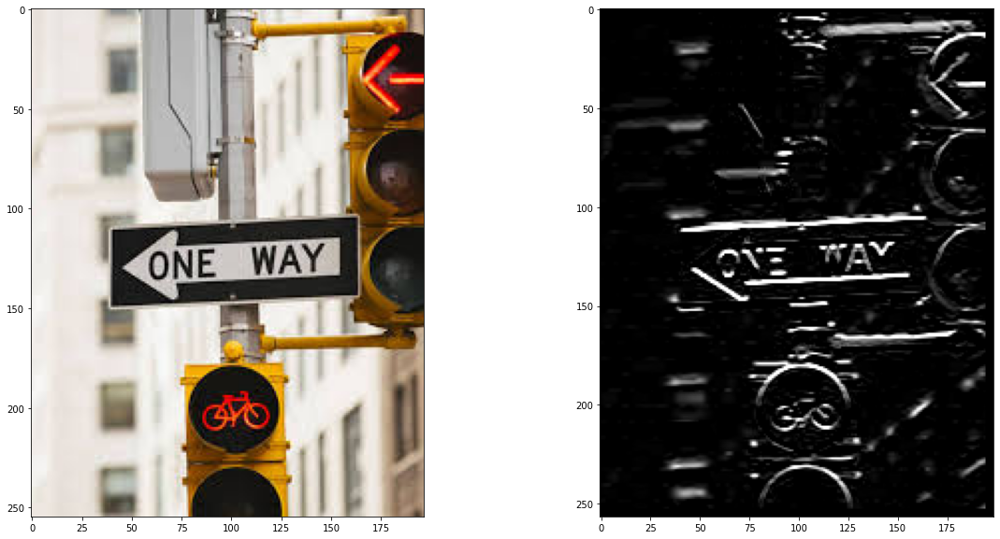

In [29]:
generateOutput(image=image, kernel=robinson_cmps_south, filename='./exports/robinson-cmp-opr-south.png', mode='grayscale', padding=2)

##### West

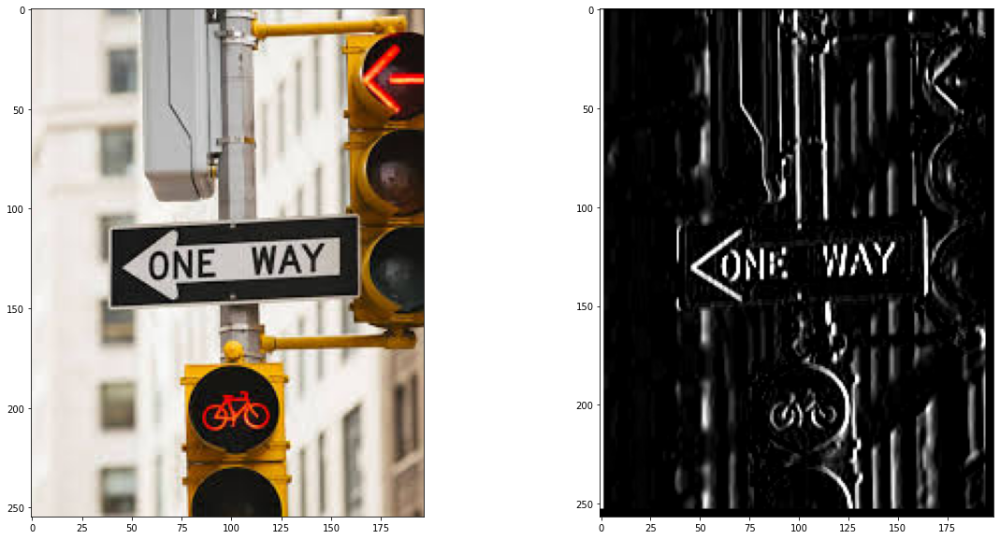

In [30]:
generateOutput(image=image, kernel=robinson_cmps_west, filename='./exports/robinson-cmp-opr-west.png', mode='grayscale', padding=2)

### Laplacian Operator

In [31]:
image = "./dataset/sign-board.jfif"

#### Laplacian Operator (Positive)

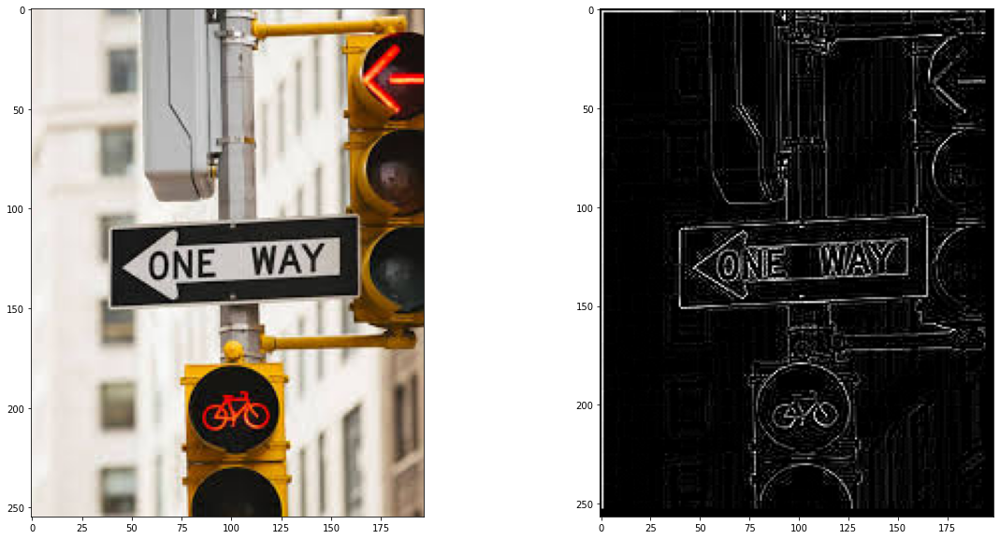

In [32]:
generateOutput(image=image, kernel=laplacian_opr_pos, filename='./exports/laplc-opr-pos.png', mode='grayscale', padding=2)

#### Laplacian Operator (Negative)

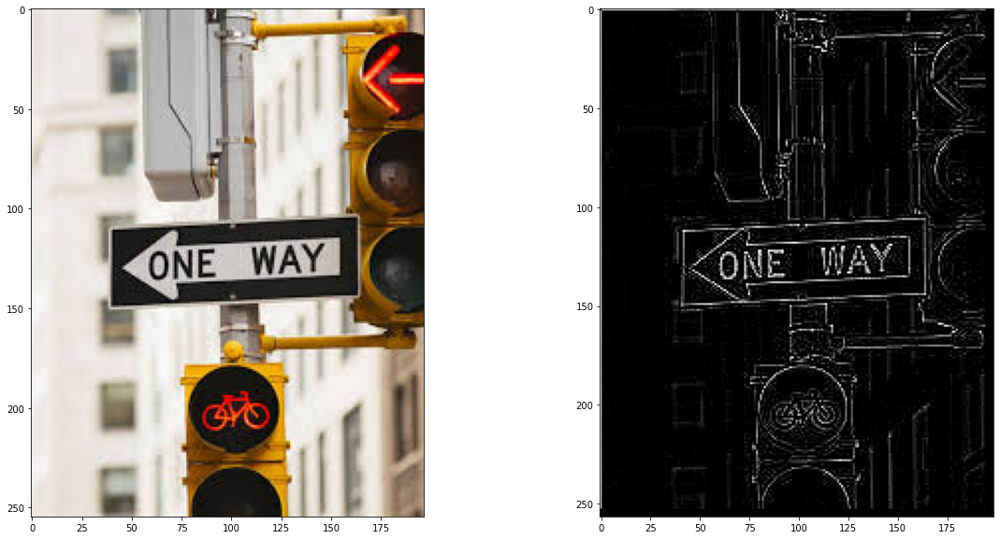

In [33]:
generateOutput(image=image, kernel=laplacian_opr_neg, filename='./exports/laplc-opr-neg.png', mode='grayscale', padding=2)